In [1]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
from pathlib import Path

# Add GENESIS to path
sys.path.insert(0, os.path.join(os.getcwd(), 'GENESIS'))

from dataloader.h5 import H5Dataset
from diffusion.schedules import (
    linear_beta_schedule,
    cosine_beta_schedule,
    quadratic_beta_schedule,
    sigmoid_beta_schedule,
    compute_alpha_schedule
)
from diffusion.forward import apply_forward_diffusion
from utils.normalize import apply_log_minmax
from utils.vis.event_show import show_event_dual_plot

In [10]:
# 데이터 경로 설정 (필요시 수정)
# h5_path = "GENESIS/GENESIS-data/22644_0921_time_shift.h5"  # 상대 경로 예시
# 또는 절대 경로 사용
h5_path = None  # None이면 자동으로 찾기 시도

# h5 파일 찾기
if h5_path is None:
    possible_paths = [
        "GENESIS/GENESIS-data/22644_0921_time_shift.h5",
        "../GENESIS-data/22644_0921_time_shift.h5",
        "./GENESIS-data/22644_0921_time_shift.h5",
    ]
    for path in possible_paths:
        if os.path.exists(path):
            h5_path = path
            break
    
    if h5_path is None:
        print("H5 파일을 찾을 수 없습니다. h5_path를 직접 설정해주세요.")
        print("예: h5_path = '/path/to/your/data.h5'")
    else:
        print(f"데이터 파일 찾음: {h5_path}")

# 데이터 로더로 이벤트 하나 불러오기
if h5_path and os.path.exists(h5_path):
    dataset = H5Dataset(h5_path=h5_path)
    event_idx = 0  # 첫 번째 이벤트
    
    sig_raw, geo_raw, label_raw = dataset[event_idx]
    # sig_raw: (2, L) - [npe, firstTime]
    # geo_raw: (3, L) - [x, y, z]
    # label_raw: (6,) - [Energy, Zenith, Azimuth, X, Y, Z]
    
    print(f"\n이벤트 {event_idx} 로드 완료:")
    print(f"  Signal shape: {sig_raw.shape}")
    print(f"  Geometry shape: {geo_raw.shape}")
    print(f"  Label shape: {label_raw.shape}")
    print(f"  Label: Energy={label_raw[0]:.4f}, Zenith={label_raw[1]:.4f}, Azimuth={label_raw[2]:.4f}")
else:
    print("데이터 파일을 찾을 수 없어 시뮬레이션 데이터를 사용합니다.")
    # 시뮬레이션 데이터 생성 (테스트용)
    sig_raw = torch.randn(2, 5160) * 10 + 50
    sig_raw[0] = torch.clamp(sig_raw[0], min=0)  # npe는 양수
    sig_raw[1] = torch.clamp(sig_raw[1], min=0)  # firstTime은 양수
    geo_raw = torch.randn(3, 5160) * 100
    label_raw = torch.tensor([100.0, 0.5, 1.0, 0.0, 0.0, 0.0])
    print("시뮬레이션 데이터 생성 완료")

데이터 파일 찾음: ./GENESIS-data/22644_0921_time_shift.h5

이벤트 0 로드 완료:
  Signal shape: torch.Size([2, 5160])
  Geometry shape: torch.Size([3, 5160])
  Label shape: torch.Size([6])
  Label: Energy=66469596.0000, Zenith=2.6949, Azimuth=2.9375


In [11]:
# 정규화 파라미터 설정 (log_minmax 사용)
npe_log_max = np.log1p(225.0)  # npe 최대값 225
ftime_log_max = np.log1p(20676.0)  # firstTime 최대값 20676

# Signal 정규화 (log_minmax)
sig_normalized = sig_raw.clone()
sig_normalized[0] = apply_log_minmax(
    sig_raw[0], 
    feature_range=(0, 1),
    data_min=0.0, 
    data_max=npe_log_max
)
sig_normalized[1] = apply_log_minmax(
    sig_raw[1], 
    feature_range=(0, 1),
    data_min=0.0, 
    data_max=ftime_log_max
)

# Batch dimension 추가
x0_sig = sig_normalized.unsqueeze(0)  # (1, 2, L)
geom = geo_raw.unsqueeze(0)  # (1, 3, L)

print(f"\n정규화 완료:")
print(f"  Normalized signal shape: {x0_sig.shape}")
print(f"  npe range: [{x0_sig[0, 0].min():.4f}, {x0_sig[0, 0].max():.4f}]")
print(f"  firstTime range: [{x0_sig[0, 1].min():.4f}, {x0_sig[0, 1].max():.4f}]")


정규화 완료:
  Normalized signal shape: torch.Size([1, 2, 5160])
  npe range: [0.0000, 0.8550]
  firstTime range: [0.0000, 0.8165]


In [12]:
# Diffusion 파라미터 설정
timesteps_total = 1000
timesteps_to_visualize = [0, 100, 300, 500, 700, 999]  # 시각화할 timestep들

# 각 스케줄러 정의
schedules = [
    ('Linear', linear_beta_schedule, {'timesteps': timesteps_total}),
    ('Cosine', cosine_beta_schedule, {'timesteps': timesteps_total, 's': 0.008}),
    ('Quadratic', quadratic_beta_schedule, {'timesteps': timesteps_total}),
    ('Sigmoid', sigmoid_beta_schedule, {'timesteps': timesteps_total}),
]

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
x0_sig = x0_sig.to(device)
geom = geom.to(device)

print(f"\n디바이스: {device}")
print(f"시각화할 timesteps: {timesteps_to_visualize}")
print(f"스케줄러: {[s[0] for s in schedules]}")


디바이스: cpu
시각화할 timesteps: [0, 100, 300, 500, 700, 999]
스케줄러: ['Linear', 'Cosine', 'Quadratic', 'Sigmoid']



[Linear 스케줄러 처리 중...]

[Cosine 스케줄러 처리 중...]

[Quadratic 스케줄러 처리 중...]

[Sigmoid 스케줄러 처리 중...]


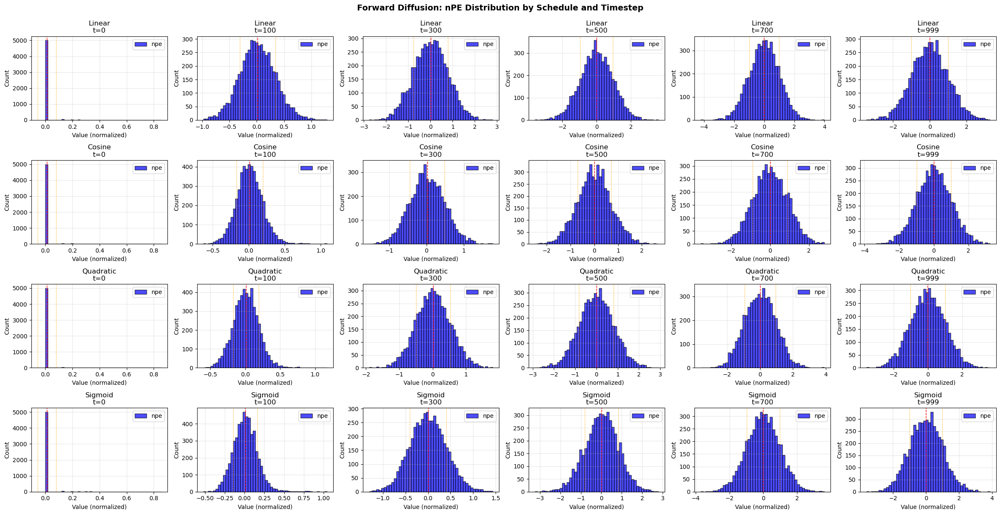

In [13]:
# 각 스케줄러마다 forward diffusion 적용 및 시각화
fig_all, axes_all = plt.subplots(len(schedules), len(timesteps_to_visualize), 
                                  figsize=(4*len(timesteps_to_visualize), 3*len(schedules)))

if len(schedules) == 1:
    axes_all = axes_all.reshape(1, -1)
if len(timesteps_to_visualize) == 1:
    axes_all = axes_all.reshape(-1, 1)

for sched_idx, (schedule_name, schedule_fn, schedule_kwargs) in enumerate(schedules):
    print(f"\n[{schedule_name} 스케줄러 처리 중...]")
    
    # Beta schedule 생성
    betas = schedule_fn(**schedule_kwargs).to(device)
    
    for t_idx, t_val in enumerate(timesteps_to_visualize):
        # Forward diffusion 적용
        t_tensor = torch.full((1,), t_val, device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(
            x0=x0_sig,
            betas=betas,
            timesteps=t_tensor,
        )
        
        # CPU로 이동 및 numpy 변환
        x_t_np = x_t[0].cpu().numpy()  # (2, L)
        npe = x_t_np[0]  # npe 채널
        ftime = x_t_np[1]  # firstTime 채널
        
        # 히스토그램 플롯
        ax = axes_all[sched_idx, t_idx]
        
        # npe 히스토그램
        ax.hist(npe, bins=50, alpha=0.7, color='blue', edgecolor='black', label='npe')
        ax.set_xlabel('Value (normalized)')
        ax.set_ylabel('Count')
        ax.set_title(f'{schedule_name}\nt={t_val}')
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # 통계 정보 추가
        mean_npe = np.mean(npe)
        std_npe = np.std(npe)
        ax.axvline(mean_npe, color='red', linestyle='--', linewidth=1, label=f'μ={mean_npe:.3f}')
        ax.axvline(mean_npe + std_npe, color='orange', linestyle='--', alpha=0.7, linewidth=0.8)
        ax.axvline(mean_npe - std_npe, color='orange', linestyle='--', alpha=0.7, linewidth=0.8)

plt.tight_layout()
plt.suptitle('Forward Diffusion: nPE Distribution by Schedule and Timestep', 
             y=1.02, fontsize=14, fontweight='bold')
plt.show()

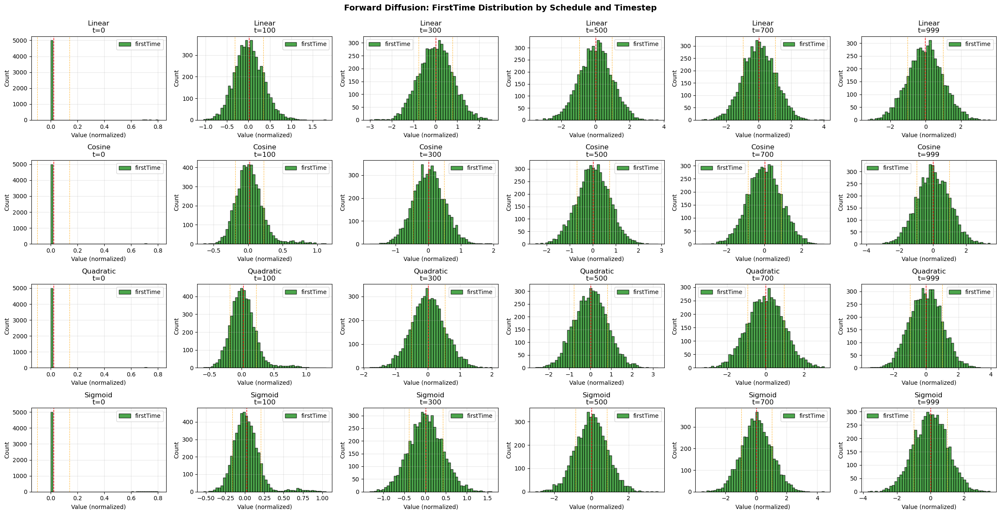

In [14]:
# firstTime 채널 시각화
fig_ftime, axes_ftime = plt.subplots(len(schedules), len(timesteps_to_visualize), 
                                     figsize=(4*len(timesteps_to_visualize), 3*len(schedules)))

if len(schedules) == 1:
    axes_ftime = axes_ftime.reshape(1, -1)
if len(timesteps_to_visualize) == 1:
    axes_ftime = axes_ftime.reshape(-1, 1)

for sched_idx, (schedule_name, schedule_fn, schedule_kwargs) in enumerate(schedules):
    # Beta schedule 생성
    betas = schedule_fn(**schedule_kwargs).to(device)
    
    for t_idx, t_val in enumerate(timesteps_to_visualize):
        # Forward diffusion 적용
        t_tensor = torch.full((1,), t_val, device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(
            x0=x0_sig,
            betas=betas,
            timesteps=t_tensor,
        )
        
        # CPU로 이동 및 numpy 변환
        x_t_np = x_t[0].cpu().numpy()  # (2, L)
        ftime = x_t_np[1]  # firstTime 채널
        
        # 히스토그램 플롯
        ax = axes_ftime[sched_idx, t_idx]
        
        # firstTime 히스토그램
        ax.hist(ftime, bins=50, alpha=0.7, color='green', edgecolor='black', label='firstTime')
        ax.set_xlabel('Value (normalized)')
        ax.set_ylabel('Count')
        ax.set_title(f'{schedule_name}\nt={t_val}')
        ax.grid(True, alpha=0.3)
        ax.legend()
        
        # 통계 정보 추가
        mean_ftime = np.mean(ftime)
        std_ftime = np.std(ftime)
        ax.axvline(mean_ftime, color='red', linestyle='--', linewidth=1, label=f'μ={mean_ftime:.3f}')
        ax.axvline(mean_ftime + std_ftime, color='orange', linestyle='--', alpha=0.7, linewidth=0.8)
        ax.axvline(mean_ftime - std_ftime, color='orange', linestyle='--', alpha=0.7, linewidth=0.8)

plt.tight_layout()
plt.suptitle('Forward Diffusion: FirstTime Distribution by Schedule and Timestep', 
             y=1.02, fontsize=14, fontweight='bold')
plt.show()

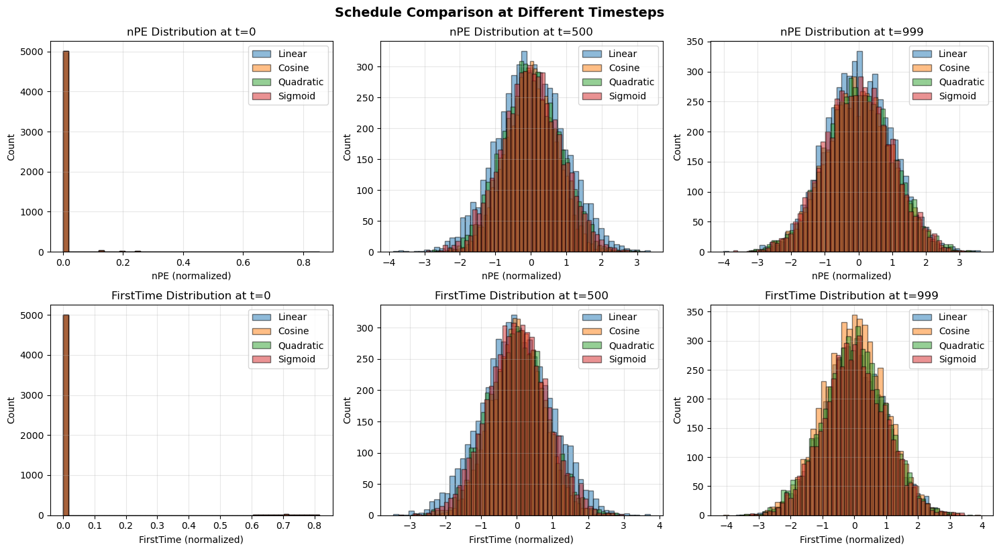

In [15]:
# 각 스케줄러의 노이즈 추가 패턴 비교 (특정 timestep에서)
comparison_timesteps = [0, 500, 999]
fig_comp, axes_comp = plt.subplots(2, len(comparison_timesteps), 
                                    figsize=(5*len(comparison_timesteps), 8))

if len(comparison_timesteps) == 1:
    axes_comp = axes_comp.reshape(2, 1)

for t_idx, t_val in enumerate(comparison_timesteps):
    # npe 채널 비교
    ax_npe = axes_comp[0, t_idx]
    for schedule_name, schedule_fn, schedule_kwargs in schedules:
        betas = schedule_fn(**schedule_kwargs).to(device)
        t_tensor = torch.full((1,), t_val, device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(x0=x0_sig, betas=betas, timesteps=t_tensor)
        npe = x_t[0, 0].cpu().numpy()
        ax_npe.hist(npe, bins=50, alpha=0.5, label=schedule_name, edgecolor='black')
    
    ax_npe.set_xlabel('nPE (normalized)')
    ax_npe.set_ylabel('Count')
    ax_npe.set_title(f'nPE Distribution at t={t_val}')
    ax_npe.legend()
    ax_npe.grid(True, alpha=0.3)
    
    # firstTime 채널 비교
    ax_ftime = axes_comp[1, t_idx]
    for schedule_name, schedule_fn, schedule_kwargs in schedules:
        betas = schedule_fn(**schedule_kwargs).to(device)
        t_tensor = torch.full((1,), t_val, device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(x0=x0_sig, betas=betas, timesteps=t_tensor)
        ftime = x_t[0, 1].cpu().numpy()
        ax_ftime.hist(ftime, bins=50, alpha=0.5, label=schedule_name, edgecolor='black')
    
    ax_ftime.set_xlabel('FirstTime (normalized)')
    ax_ftime.set_ylabel('Count')
    ax_ftime.set_title(f'FirstTime Distribution at t={t_val}')
    ax_ftime.legend()
    ax_ftime.grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('Schedule Comparison at Different Timesteps', 
             y=1.02, fontsize=14, fontweight='bold')
plt.show()

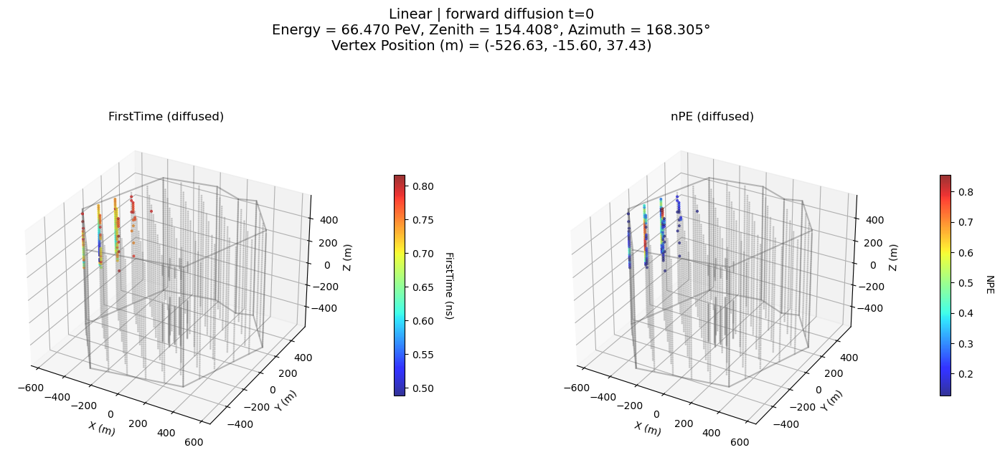

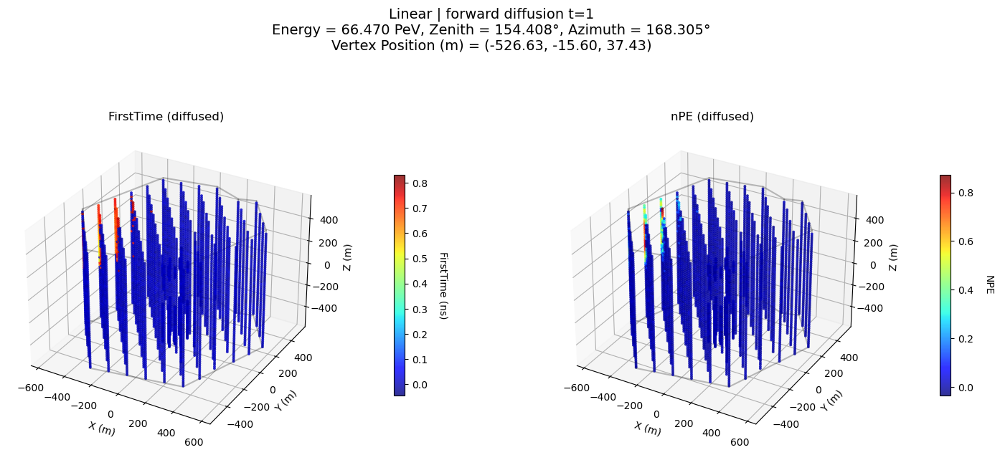

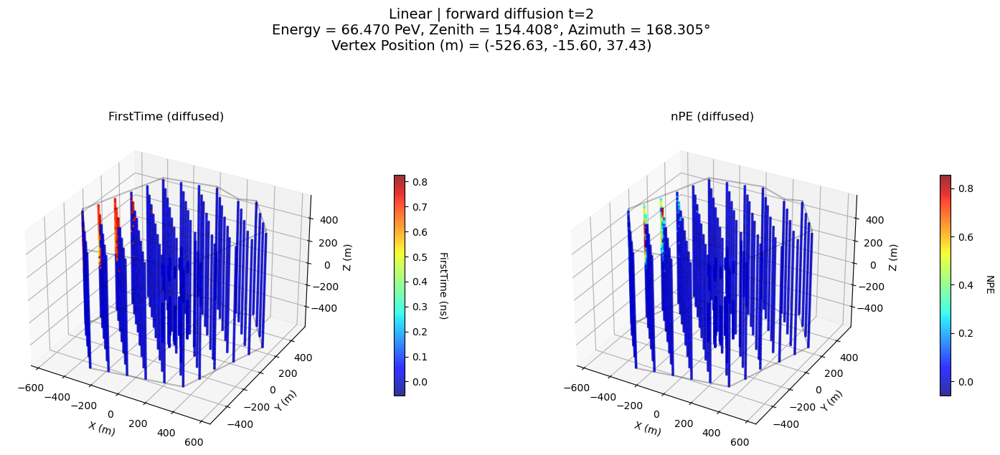

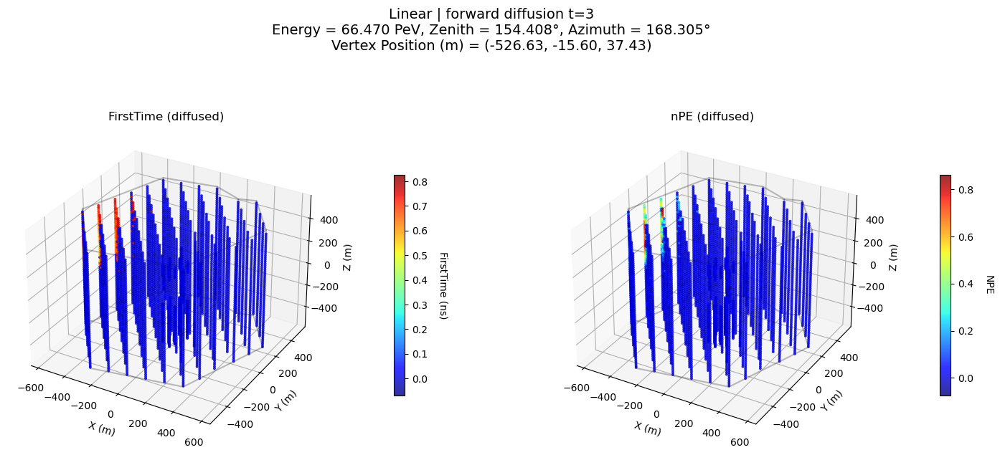

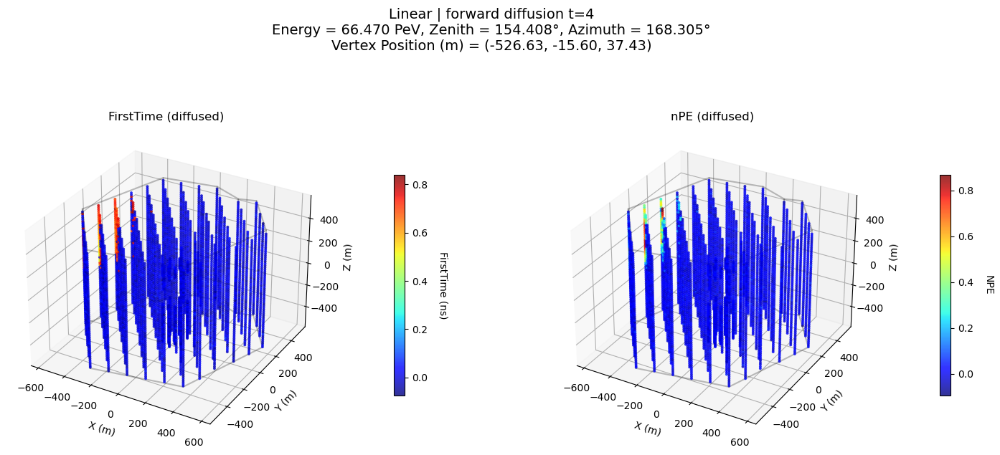

...

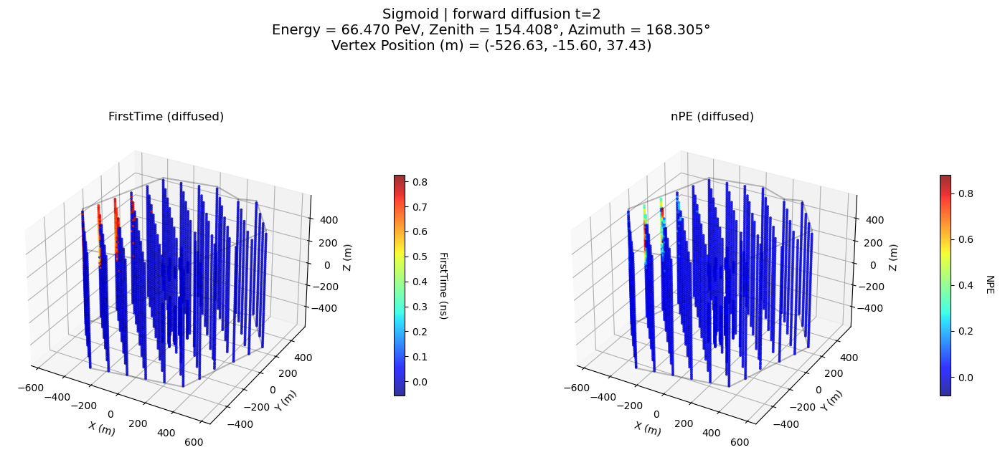

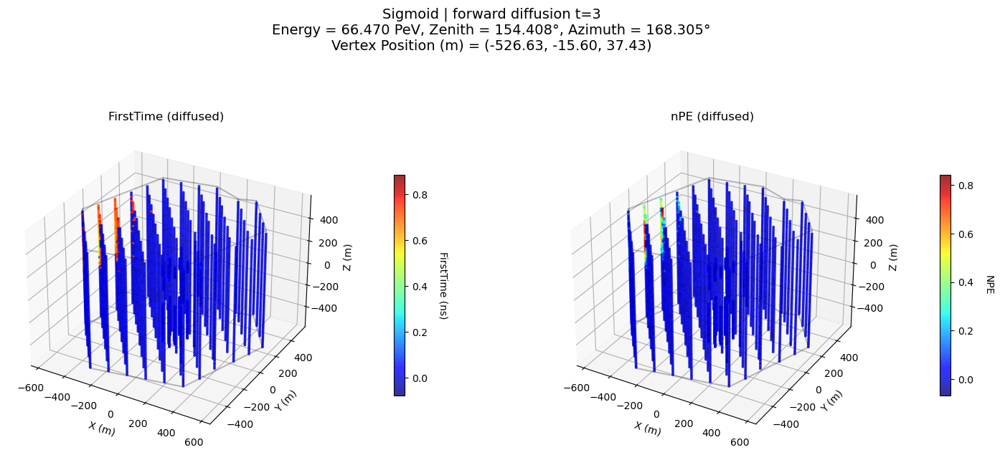

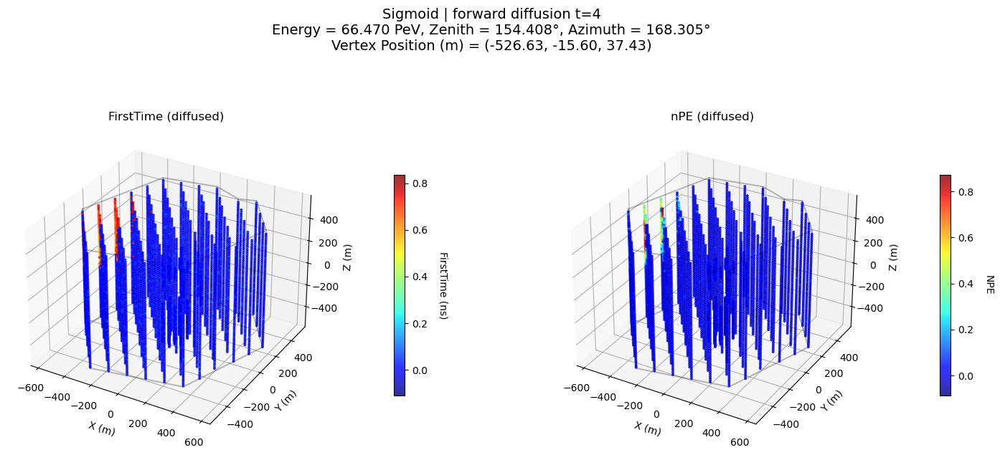

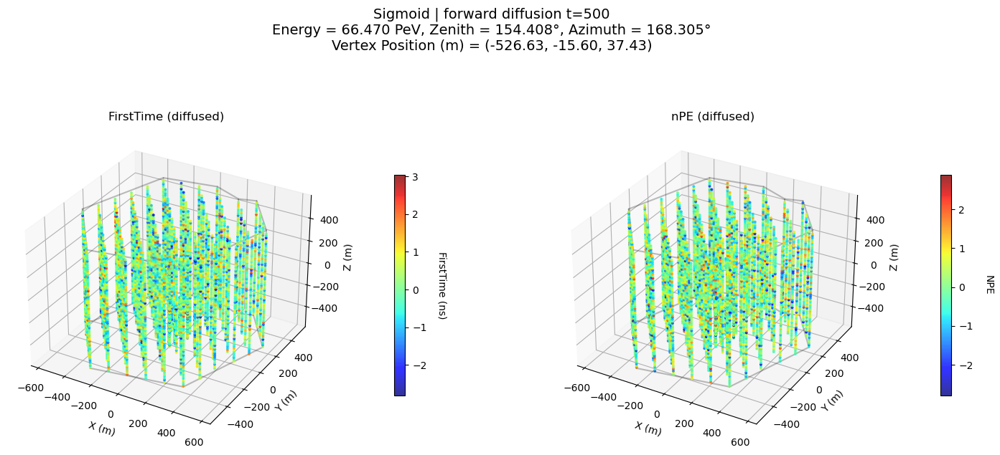

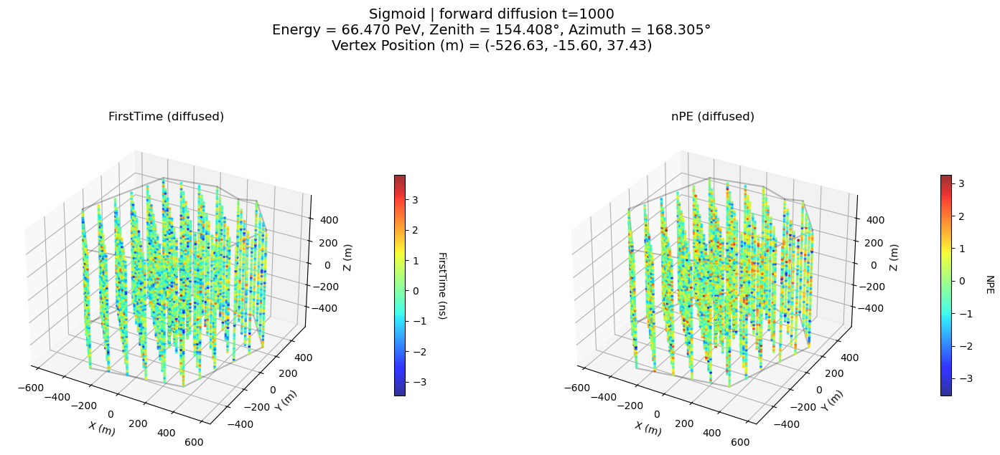

In [17]:
# IceCube layout(3D)로 이벤트 시각화: 스케줄러별 forward diffusion 결과
# - show_event_dual_plot(sig, geo, label) 사용
# - sig: (2, L) [npe, firstTime]
# - geo: (3, L) [x, y, z]
# - label: (6,)  [Energy, Zenith, Azimuth, X, Y, Z]

# 시각화할 timestep 선택 (필요하면 바꿔도 됨)
layout_timesteps = [0, 1,2,3,4,500, 1000]

# geo/label은 원본을 사용 (diffusion은 sig에만 적용)
geo_np = geo_raw.detach().cpu().numpy() if torch.is_tensor(geo_raw) else np.asarray(geo_raw)
label_np = label_raw.detach().cpu().numpy() if torch.is_tensor(label_raw) else np.asarray(label_raw)

# x0_sig가 이전 셀에서 준비되어 있어야 함: shape (1, 2, L)
if "x0_sig" not in globals():
    raise RuntimeError("x0_sig가 없습니다. 먼저 데이터 로드/정규화 셀을 실행해주세요.")
if "schedules" not in globals():
    raise RuntimeError("schedules가 없습니다. 먼저 스케줄러 설정 셀을 실행해주세요.")
if "device" not in globals():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for schedule_name, schedule_fn, schedule_kwargs in schedules:
    betas = schedule_fn(**schedule_kwargs).to(device)

    for t_val in layout_timesteps:
        t_tensor = torch.full((1,), int(t_val), device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(x0=x0_sig, betas=betas, timesteps=t_tensor)  # (1, 2, L)
        sig_t = x_t[0].detach().cpu().numpy()  # (2, L)

        fig, _ = show_event_dual_plot(
            sig=sig_t,
            geo=geo_np,
            label=label_np,
            figure_size=(18, 8),
            marker_size=8.0,
            show_detector_hull=True,
            show=False,
            title_prefix=f"{schedule_name} | forward diffusion t={t_val}",
            firsttime_title="FirstTime (diffused)",
            npe_title="nPE (diffused)",
        )
        plt.show()

In [18]:
# (간단) 스케줄러별 forward diffusion를 GIF로 저장
# 필요 패키지 (tpn conda env에서 설치):
#   conda install -c conda-forge imageio pillow
# (MP4로 하고 싶으면 추가로 ffmpeg 필요)

from pathlib import Path

try:
    import imageio.v2 as imageio
except Exception as e:
    raise ImportError(
        "imageio가 필요합니다. tpn 환경에서 `conda install -c conda-forge imageio pillow` 해주세요.\n"
        f"원인: {e}"
    )

# --- 설정 ---
event_idx_to_render = 0          # 보고/저장할 이벤트 번호
schedule_name_to_render = None    # None이면 모든 스케줄러, 아니면 예: "Cosine"
frames = list(range(0, 1000, 25)) + [999]  # 프레임 timestep들 (간단 버전)
fps = 6
out_dir = Path("./outputs/animations")
out_dir.mkdir(parents=True, exist_ok=True)

# --- 이벤트 준비 (원하면 여기서 event 번호 바꿔 로드) ---
if "dataset" in globals() and "h5_path" in globals() and h5_path and (event_idx_to_render is not None):
    try:
        sig_raw, geo_raw, label_raw = dataset[int(event_idx_to_render)]
        print(f"[OK] event {event_idx_to_render} 로드")
    except Exception as e:
        print(f"[WARN] event {event_idx_to_render} 로드 실패 -> 현재 메모리의 sig_raw/geo_raw/label_raw 사용. 원인: {e}")

geo_np = geo_raw.detach().cpu().numpy() if torch.is_tensor(geo_raw) else np.asarray(geo_raw)
label_np = label_raw.detach().cpu().numpy() if torch.is_tensor(label_raw) else np.asarray(label_raw)

# x0_sig 재준비(현재 sig_raw 기준)
# - 이전 셀에서 쓰던 정규화 파라미터(npe_log_max/ftime_log_max)가 있으면 그대로 사용
sig_np = sig_raw.detach().cpu().numpy() if torch.is_tensor(sig_raw) else np.asarray(sig_raw)

if "npe_log_max" not in globals() or "ftime_log_max" not in globals():
    raise RuntimeError("npe_log_max/ftime_log_max가 없습니다. 정규화 셀을 먼저 실행해주세요.")

sig_norm = np.zeros_like(sig_np, dtype=np.float32)
# 채널 0: nPE
sig_norm[0] = apply_log_minmax(sig_np[0], feature_range=(-1, 1), data_min=0.0, data_max=float(npe_log_max))
# 채널 1: firstTime
sig_norm[1] = apply_log_minmax(sig_np[1], feature_range=(-1, 1), data_min=0.0, data_max=float(ftime_log_max))

x0_sig = torch.from_numpy(sig_norm).unsqueeze(0).to(device)  # (1, 2, L)

if "schedules" not in globals():
    raise RuntimeError("schedules가 없습니다. 스케줄러 설정 셀을 먼저 실행해주세요.")

# --- GIF 생성 ---
for s_name, schedule_fn, schedule_kwargs in schedules:
    if schedule_name_to_render is not None and s_name != schedule_name_to_render:
        continue

    betas = schedule_fn(**schedule_kwargs).to(device)

    frame_paths = []
    for t_val in frames:
        t_tensor = torch.full((1,), int(t_val), device=device, dtype=torch.long)
        x_t = apply_forward_diffusion(x0=x0_sig, betas=betas, timesteps=t_tensor)  # (1, 2, L)
        sig_t = x_t[0].detach().cpu().numpy()  # (2, L)

        png_path = out_dir / f"event{int(event_idx_to_render):04d}_{s_name}_t{int(t_val):04d}.png"
        fig, _ = show_event_dual_plot(
            sig=sig_t,
            geo=geo_np,
            label=label_np,
            output_path=str(png_path),
            figure_size=(18, 8),
            marker_size=8.0,
            show_detector_hull=True,
            show=False,
            title_prefix=f"event {int(event_idx_to_render)} | {s_name} | t={int(t_val)}",
            firsttime_title="FirstTime (diffused)",
            npe_title="nPE (diffused)",
        )
        plt.close(fig)
        frame_paths.append(png_path)

    gif_path = out_dir / f"event{int(event_idx_to_render):04d}_{s_name}.gif"
    # 모든 이미지를 읽고, 첫 번째 이미지 크기에 맞춰 리사이즈 (크기 불일치 문제 해결)
    images = []
    target_size = None
    for p in frame_paths:
        img = imageio.imread(p)
        if target_size is None:
            target_size = (img.shape[1], img.shape[0])  # (width, height)
        if img.shape[:2] != (target_size[1], target_size[0]):
            # PIL Image로 리사이즈
            from PIL import Image
            pil_img = Image.fromarray(img)
            pil_img = pil_img.resize(target_size, Image.Resampling.LANCZOS)
            img = np.array(pil_img)
        images.append(img)
    
    imageio.mimsave(gif_path, images, fps=fps)
    print(f"[SAVED] {gif_path} (총 {len(images)} 프레임)")

[OK] event 0 로드
Event dual visualization saved to outputs/animations/event0000_Linear_t0000.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0025.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0050.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0075.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0100.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0125.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0150.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0175.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0200.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0225.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0250.png
Event dual visualization saved to outputs/animations/event0000_Linear_t0275.png
Event dual visualization

ValueError: all input arrays must have the same shape